# Loading packages

In [1]:
%matplotlib inline
import numpy as np
import yaml
import matplotlib.pyplot as plt
import pandas as pd
import os

from clawpack.pyclaw.solution import Solution
from clawpack.pyclaw import solution
import matplotlib.animation
    
# Finding the home directory
from os.path import expanduser
home = expanduser("~")
cwd = os.getcwd()

user_directory = cwd

dirName = '_output'  #directory in which the results lie
dirAddress = user_directory+"/"+dirName
plt.rcParams['text.usetex'] = True
##########
#  AVAC  #
##########
from module_avac import check_claw, check_version 
from module_avac import flatten_dict
from module_avac import make_output 

In [2]:
0.1-np.tan(np.deg2rad(5))

0.012511336474075999

# Computational parameters

In [81]:
xlower = -10.
xupper = 20
slope  = -np.deg2rad(5)
mx     = 24000
θ      = slope
domain = {'xlower':xlower, 'xupper':xupper, 'mx':mx}
computation = {'left_boundary':'wall','right_boundary':'extrap','t_max':20,'nb_simul':200}
rheology = {'friction_forcing': False, 'Manning':0, 'gravity': 9.81, 'rho':1000, 'mu':0.2}

## Topography

In [82]:



def make_topo(xlower, xupper, mx, slope):
    x = np.linspace(xlower, xupper, mx+1)
    # topo
    def fnc_topo(x,slope):
        """
        inclined plane
        """
        z = np.tan(slope )*x
        return z
        
    z = fnc_topo(x,slope)
    # export
    fname='topography.data'

    with open(fname,'w') as f:
            f.write('%i   # number of points\n' % (mx+1))

            for i in range(mx+1):
                f.write('%15.8f %15.8f\n' % (x[i], z[i]))
            f.close()

In [83]:
make_topo(xlower,xupper,mx,slope)

In [84]:
topo_data= pd.read_csv('topography.data',sep=r'\s+',names=['x','z'],header=1)

Text(0, 0.5, '$z$')

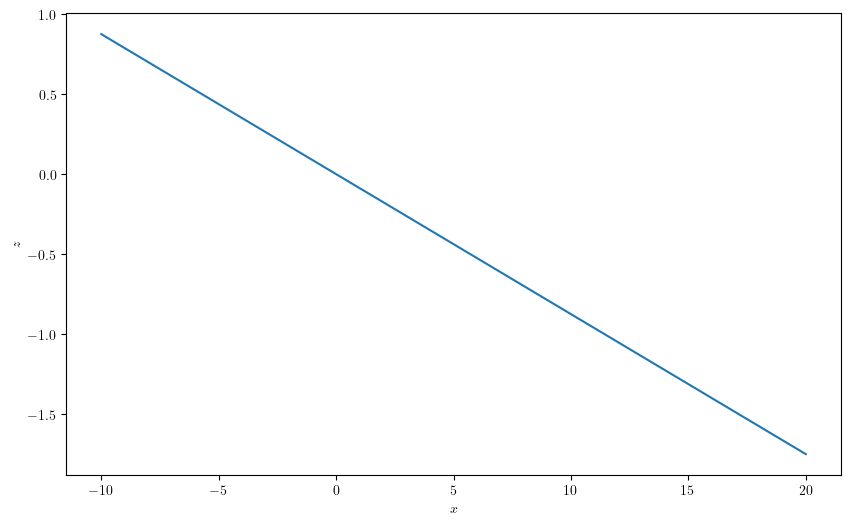

In [85]:
fig, ax = plt.subplots(figsize=(10,6))
 
ax.plot(topo_data.x, topo_data.z )
#ax.legend(loc='right')
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$z$')

## Exporting parameters

In [86]:
parameters  = {'domain':domain,'computation':computation, 'rheology':rheology}

file_name = 'geoclaw_parameters.yaml'
with open(file_name, 'w') as file:
    yaml.dump(parameters, file)

print("Data has been written to "+file_name)

Data has been written to geoclaw_parameters.yaml


# Running geoclaw

In [87]:
make_output(parameters,verbosity=False)

I will make an AVAC computation.
Times: from t = 0 to t = 20 s with a time step dt = 0.1 s.


Makefile:72: avertissement : surchargement de la recette pour la cible « all »
/home/ancey/clawpack_git/clawpack/clawutil/src/Makefile.common:323: avertissement : ancienne recette ignorée pour la cible « all »


rm -f xgeo                           bc1.f.html out1.f.html  b4step1.f90.html myfunctions.f90.html qinit.f90.html setprob.f90.html src1.f90.html  module_avac.py.html setrun.py.html bouss.data.html claw.data.html dtopo.data.html gauges.data.html geoclaw.data.html grid.data.html setprob.data.html topo.data.html topography.data.html   Makefile.html
rm -f .data .output .plots .htmls 
Computation is successful.


# Plotting solution

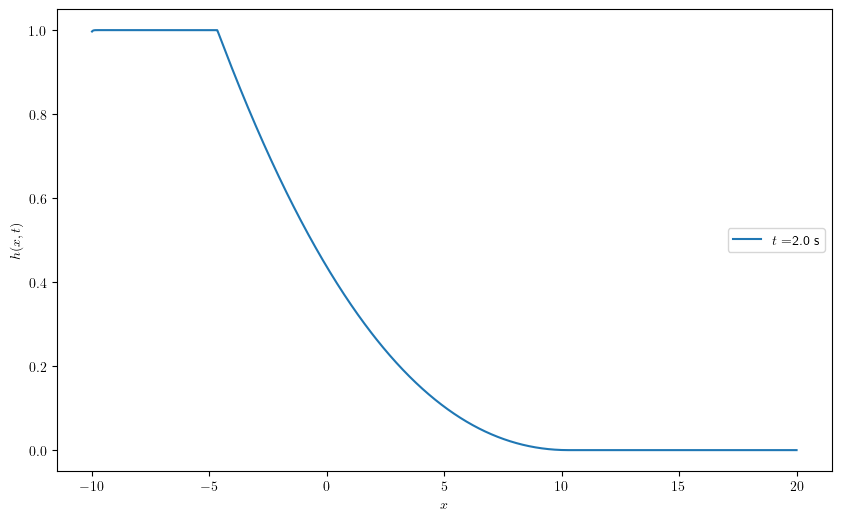

In [88]:
frameNo = 20
framesoln = solution.Solution(frameNo,  path=dirAddress,file_format='ascii')

x=framesoln.state.grid.x.centers
h=framesoln.state.q[0]
tt = framesoln.t
 
 

 
#true = qtrue(x,t)
fig, ax = plt.subplots(figsize=(10,6))
 
ax.plot(x, h,  label=r'$ t = $'+str(framesoln.t)+" s")
 
ax.legend(loc='right')
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$h(x, t)$');

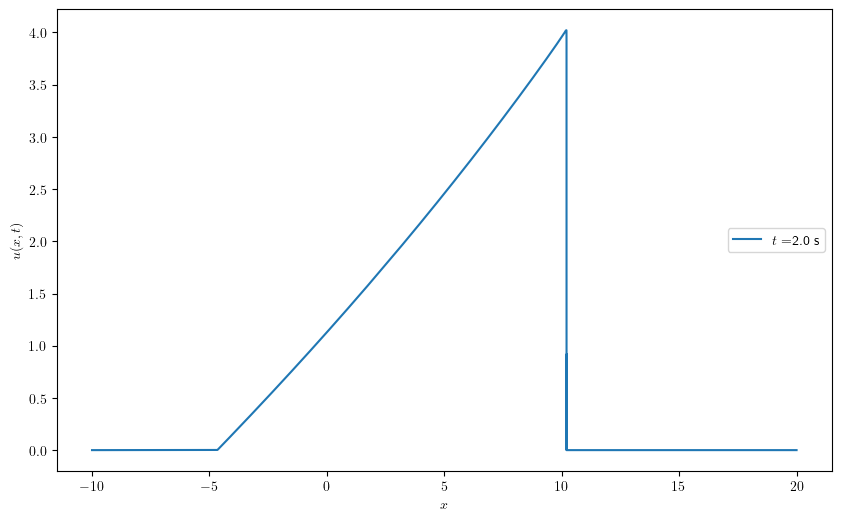

In [89]:
frameNo = 20
framesoln = solution.Solution(frameNo,  path=dirAddress,file_format='ascii')

x=framesoln.state.grid.x.centers
h=framesoln.state.q[0]
q=framesoln.state.q[1]
u=np.where(h>0.,1/(1e-10+h),0.)*q
tt = framesoln.t
 
 

 
#true = qtrue(x,t)
fig, ax = plt.subplots(figsize=(10,6))
 
ax.plot(x, u,  label=r'$ t = $'+str(framesoln.t)+" s")
 
ax.legend(loc='right')
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$u(x, t)$');

# Creating animation

In [90]:
# Animation for depth 

NbSim = computation['nb_simul']


## Flow depth on the sloping bed

In [91]:
# Animation for depth 
def dambreak_animation():
    sol=solution.Solution(1, path=dirAddress, file_format='ascii')
    frame = np.empty((NbSim,)+sol.state.q.shape)
    xsol = np.empty((NbSim, sol.state.q.shape[1]))
    hsol = np.empty((NbSim, sol.state.q.shape[1]))
    tps  = np.empty(NbSim)
    s    = sol.state.aux[0]

    for i in range(0,NbSim):
        sol     = solution.Solution(i, path=dirAddress, file_format='ascii')
        tps[i]  = sol.t
        xsol[i] = sol.state.grid.x.centers
        hsol[i] = sol.state.q[0]+s

    hmin = -1
    hmax = 3
    L = max(xsol[0])
    x0 = min(xsol[0])
    
    x_true = np.linspace(x0, L , 500)
    
    fig, axes = plt.subplots(figsize=(12, 4))
    
    plt.rcParams['text.usetex'] = True
    axes.set_xlabel(r'$x$ [m]',fontsize=14)
    axes.set_ylabel(r'$h(x, t)$ [m]',fontsize=14)
    axes.set_xlim((x_true[0], x_true[-1]))
    #axes.set_ylim(( hmin, hmax))
    axes.set_title(" ")
    text = axes.text(L/2, 0.95 , '')
 
    def init():
        computed_line, = axes.plot(xsol[0][0], hsol[0][0], 'r')
        #exact_line, = axes.plot(x_true[0], 0 , 'k--')
        exact_line, = axes.plot(xsol[0], s , 'brown')
        axes.plot(xsol[0] , hsol[0] , '--')
        return  (computed_line, exact_line)
    
    computed_line, exact_line = init()
 
    def fplot(n):
        tt = tps[n]
 
        computed_line.set_data(xsol[n] ,  hsol[n] )
        tt = tps[n]
        val = f'{tt:.2f}'
        text.set_text(r'$ t = {} $ s'.format(val))
         
        return (computed_line, exact_line)

    frames_to_plot = range(0, NbSim)
    plt.close(fig)
    return matplotlib.animation.FuncAnimation(fig, fplot, frames=frames_to_plot, interval=100,
                                   blit=True, init_func=None, repeat=False)


from IPython.display import HTML 
anim = dambreak_animation( )
HTML(anim.to_jshtml()) 

2025-07-27 15:36:54,846 INFO CLAW: Animation.save using <class 'matplotlib.animation.HTMLWriter'>


## Flow depth with the bottom set to horizontal

In [92]:

def dambreak_animation_h():
    sol=solution.Solution(1, path=dirAddress, file_format='ascii')
    frame = np.empty((NbSim,)+sol.state.q.shape)
    xsol = np.empty((NbSim, sol.state.q.shape[1]))
    hsol = np.empty((NbSim, sol.state.q.shape[1]))
    tps  = np.empty(NbSim)
    s    = sol.state.aux[0]

    for i in range(0,NbSim):
        sol     = solution.Solution(i, path=dirAddress, file_format='ascii')
        tps[i]  = sol.t
        xsol[i] = sol.state.grid.x.centers
        hsol[i] = sol.state.q[0] 

    hmin = 0
    hmax = np.max(hsol[0])
    L  = max(xsol[0])
    x0 = min(xsol[0])
    
    x_true = np.linspace(x0, L , 500)
    
    fig = plt.figure()
    axes = plt.subplot(1, 1, 1)
    plt.rcParams['text.usetex'] = True
    axes.set_xlabel(r'$x$ [m]',fontsize=14)
    axes.set_ylabel(r'$h(x, t)$ [m]',fontsize=14)
    axes.set_xlim((x[0], x[-1]))
    axes.set_ylim(( hmin, hmax))
    axes.set_title(" ")
    text = axes.text(L/2, 0.9*hmax , '')
 
    def init():
        computed_line, = axes.plot(xsol[0][0], hsol[0][0], 'r')
         
        #exact_line, = axes.plot(xsol[0], np.zeros_like(xsol[0]) , 'brown')
        exact_line, = axes.plot(xsol[0], hsol[0]  , '--')
        return  (computed_line, exact_line)
    
    computed_line, exact_line = init()
 
    def fplot(n):
        tt = tps[n]
        # if tt>0:
        #     htrue=(2*c0-x_true/tt)**2/9/g  \
        #      *np.where((x_true < 2*c0*tt) & (-c0*tt<x_true), 1, 0)+np.where(x_true < -c0*tt  , 1,0)
        # else:
        #     htrue= np.where(x_true < 0 , 1,0)
        computed_line.set_data(xsol[n] ,  hsol[n] )
        tt = tps[n]
        val = f'{tt:.2f}'
        text.set_text(r'$ t = {} $ s'.format(val))
         
        return (computed_line, exact_line)

    frames_to_plot = range(0, NbSim)
    plt.close(fig)
    return matplotlib.animation.FuncAnimation(fig, fplot, frames=frames_to_plot, interval=100,
                                   blit=True, init_func=None, repeat=False)


from IPython.display import HTML 
anim = dambreak_animation_h( )
HTML(anim.to_jshtml()) 

2025-07-27 15:37:31,378 INFO CLAW: Animation.save using <class 'matplotlib.animation.HTMLWriter'>


## Determing the front and back points (+scales)

In [93]:
#θ   = 10*np.pi/180
μ   = rheology['mu']-np.tan(abs(θ) ) # beccause θ < 0
g   = rheology['gravity']*np.cos(θ)
K   = 1
h_0 = 1
H0  = h_0
X0  = K/μ*h_0
U0  = np.sqrt(g*H0*K)
T0  = np.sqrt(H0*K/g)/μ
#xb  = -40#-H0/np.tan(θ) 

sol   = solution.Solution(1, path=dirAddress, file_format='ascii')
frame = np.empty((NbSim,)+sol.state.q.shape)
xsol = np.empty((NbSim, sol.state.q.shape[1]))
hsol = np.empty((NbSim, sol.state.q.shape[1]))
qsol = np.empty((NbSim, sol.state.q.shape[1]))
usol = np.empty((NbSim, sol.state.q.shape[1]))
Hs   = np.empty((NbSim, sol.state.q.shape[1]))
HsDx = np.empty((NbSim, sol.state.q.shape[1]))
tps  = np.empty(NbSim)
dx   = (sol.domain.grid.x.upper-sol.domain.grid.x.lower)/sol.domain.grid.x.num_cells

for i in range(0,NbSim):
    sol     = solution.Solution(i, path=dirAddress, file_format='ascii')
    tps[i]  = sol.t
    xsol[i] = sol.state.grid.x.centers
    hsol[i] = sol.state.q[0]
    qsol[i] = sol.state.q[1]
    usol[i] = np.where(hsol[i]>0.,1/(1e-10+hsol[i]),0.)*qsol[i]
    Hs[i]   = hsol[i]*np.cos(θ)+usol[i]**2/2/g
    HsDx[i] = np.sin(θ)-np.insert(np.diff(Hs[i]) ,0,0)/dx

Text(0.9, 0.1, '(b)')

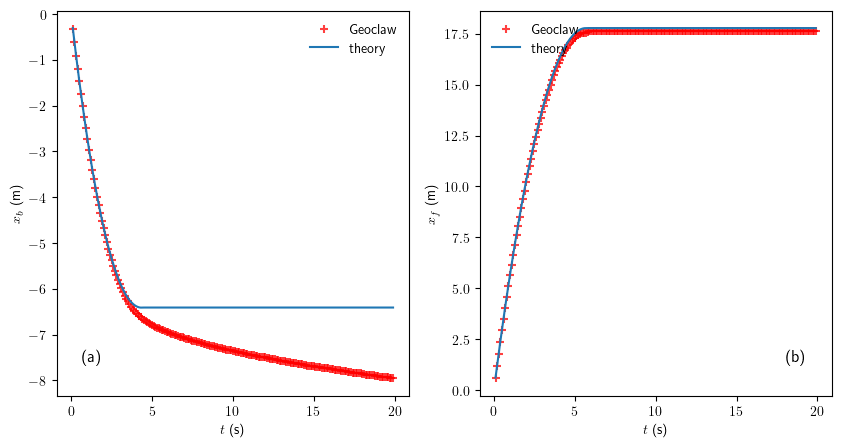

In [94]:
x_front = []
h_back = []
x_back  = []
ϵ = 1e-5
ϵ2 = 1e-4
for i in range(1,NbSim):

    posf1 = xsol[i][(hsol[i]==1.)][-1]
    posf  = posf1
    hf   = hsol[i][xsol[i] ==posf]
    x_back.append(posf)
    h_back.append(hf)
    posf = np.max(xsol[i][usol[i] >ϵ])
    if i>1:
        posf1 = x_front[-1]
        x_front.append(max(posf,posf1))
        #print(f'* {posf}, {posf1}')
    else:
        x_front.append(posf)

x_back = np.array(x_back)
x_front = np.array(x_front)
 
def sol_A(t):
    """ front position """
    return np.where(t < 2, 
                   2*t- t**2/2, 
                   2)
  


def sol_B(t):
    """ back front position """
    # x_b = 3.4779*(1+t/2)-0.664*(1+t/2)**2-0.09623*(1+t/2)**3+0.034475*(1+t/2)**4
    # x_b = 3.6223453807945707 -5.400559537999306* (1+t/2)+ \
    #     2.0222717471071308* (1+t/2)**2-0.4080853695712823* (1+t/2)**3+0.26528651975070405* (1+t/2)**4-\
    #     0.130774316010968* (1+t/2)**5+0.033614410186182296* (1+t/2)**6-0.004098834257031028* (1+t/2)**7
    b = 0.5*t+1
    #return -(-3.504283333333333 + 4.9558*b - 1.328*b**2 - 0.19246666666666667*b**3 + 0.06895*b**4)
    x_b =  -(-3.64928+5.47993*b-2.06989* b**2+0.319976* b**3-0.103745 *b**4+0.0230073* b**5)
    return np.where(t < 1.529654, 
                   x_b, 
                   -0.721)

 

fig, ((ax1, ax2) ) = plt.subplots(1, 2)
fig.set_figheight(5)
fig.set_figwidth(10)
ax1.scatter(tps[1:NbSim] ,x_back ,marker='+',color='red',alpha=0.75,label='Geoclaw')
ax1.plot(tps[1:NbSim],sol_B(tps[1:NbSim]/T0)*X0,'-',label='theory')
ax1.set_xlabel(r'$t$ (s)')
ax1.set_ylabel(r'$x_b$ (m)')
ax1.text(0.1, 0.1,  '(a)',
        horizontalalignment='center',
        verticalalignment='center',
        transform = ax1.transAxes,fontsize=12)

ax2.scatter(tps[1:NbSim] ,x_front ,marker='+',color='red',alpha=0.75,label='Geoclaw')
ax2.plot(tps[1:NbSim],sol_A(tps[1:NbSim]/T0)*X0,'-',label='theory')
ax2.set_xlabel(r'$t$ (s)')
ax2.set_ylabel(r'$x_f$ (m)')
ax1.legend(loc="upper right",ncol=1,frameon=False)
ax2.legend(loc="upper left",ncol=1,frameon=False)
ax2.text(0.9, 0.1,  '(b)',
        horizontalalignment='center',
        verticalalignment='center',
        transform = ax2.transAxes,fontsize=12)

Text(0.9, 0.1, '(b)')

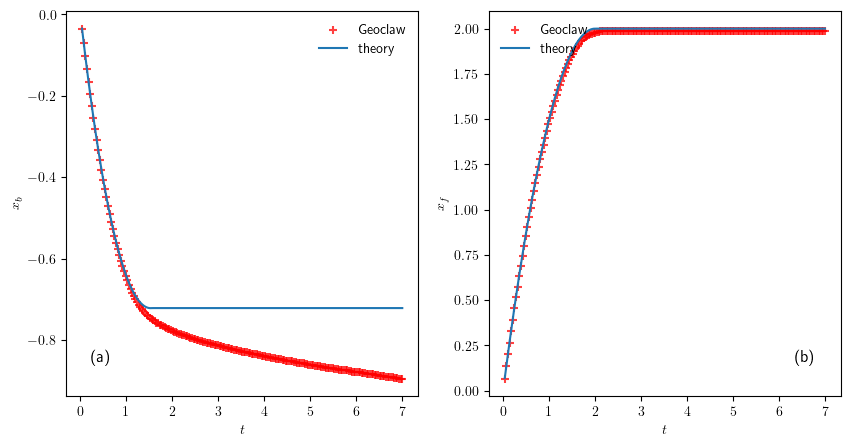

In [95]:
fig, ((ax1, ax2) ) = plt.subplots(1, 2)
fig.set_figheight(5)
fig.set_figwidth(10)
ax1.scatter(tps[1:NbSim]/T0 ,x_back/X0 ,marker='+',color='red',alpha=0.75,label='Geoclaw')
ax1.plot(tps[1:NbSim]/T0,sol_B(tps[1:NbSim]/T0),'-',label='theory')
ax1.set_xlabel(r'$t$ ' )
ax1.set_ylabel(r'$x_b$  ')
ax1.text(0.1, 0.1,  '(a)',
        horizontalalignment='center',
        verticalalignment='center',
        transform = ax1.transAxes,fontsize=12)

ax2.scatter(tps[1:NbSim]/T0 ,x_front/X0 ,marker='+',color='red',alpha=0.75,label='Geoclaw')
ax2.plot(tps[1:NbSim]/T0,sol_A(tps[1:NbSim]/T0) ,'-',label='theory')
ax2.set_xlabel(r'$t$  ')
ax2.set_ylabel(r'$x_f$  ')
ax1.legend(loc="upper right",ncol=1,frameon=False)
ax2.legend(loc="upper left",ncol=1,frameon=False)
ax2.text(0.9, 0.1,  '(b)',
        horizontalalignment='center',
        verticalalignment='center',
        transform = ax2.transAxes,fontsize=12)

In [96]:
fig.savefig("comparison_xb_xf.png",dpi=300,bbox_inches='tight')

# Characteristics

In [97]:
# Interpolating functions
from scipy.interpolate import RegularGridInterpolator
hmat = np.array([hsol[i] for i in range(NbSim)])
umat = np.array([usol[i] for i in range(NbSim)])

interp_h = RegularGridInterpolator((xsol[0], tps ), hmat.T, bounds_error=False, fill_value=0.0)
interp_u = RegularGridInterpolator((xsol[0], tps ), umat.T, bounds_error=False, fill_value=0.0)

def fnc_h(x,t):
    return interp_h([x,t])[0]

def fnc_u(x,t):
    return interp_u([x,t])[0]

## Characteristic diagram with physical units

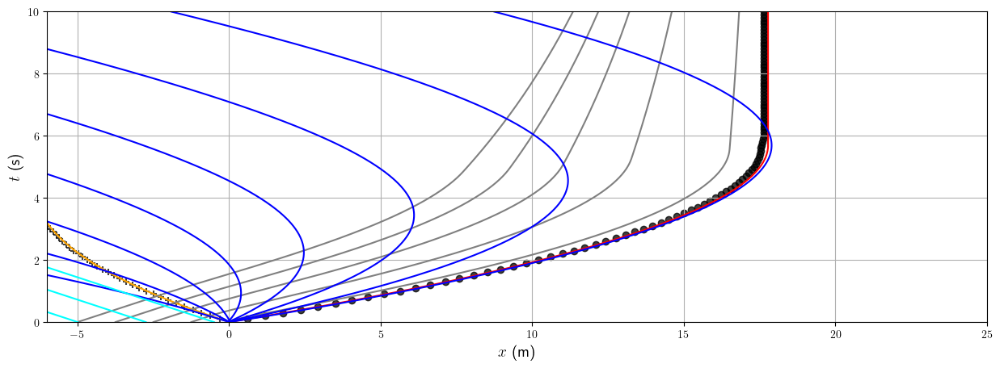

In [98]:
from scipy.integrate import solve_ivp, odeint
# Define the ODE system
def charac_r(x, t):
    """compute the r-characteristic"""
    # x must be a scalar for interpolation
    x = x.item() if np.size(x) == 1 else x           # scalar extraction
    point = np.array([[x, t]])                       # point (x,t). Note that shape is (1,2)
    dxdt = interp_u(point)+(g*interp_h(point))**0.5  # Interpolate
    return dxdt[0]   

def charac_s(x, t):
    """compute the s-characteristic"""
    x = x.item() if np.size(x) == 1 else x   
    point = np.array([[x, t]])   
    dxdt = interp_u(point)-(g*interp_h(point))**0.5  
    return dxdt[0]   

def charac_s_variante(x, t, s, μ, g): 
    """
    compute the s-characteristic. In the variant, we use the fact that
    u-2c = -2s-t => u = 2c-2s-t (in a dimensionless form)
    x, t are assumed to be dimensional, and s in the range [-1,1]
    """
    x     = x.item() if np.size(x) == 1 else x   
    point = np.array([[x, t]])  
    u     = interp_u(point)
    h     = interp_h(point)

    if h<0: h=0.
    c     = np.sqrt(g*h)
    dxdt  =  c-2*s*U0-μ*g*t # in physical units
    return dxdt

def test_xb(t):
    tb = 2 
    return sol_B(t)

def test_xf(t):
    return  sol_A(t)

fig, axes = plt.subplots(figsize=(15, 5))
plt.rcParams['text.usetex'] = True
axes.set_xlabel(r'$x$ (m)',fontsize=14)
axes.set_ylabel(r'$t$ (s)',fontsize=14)
axes.set_xlim((-6,25))
axes.set_ylim((0,10))
 
 
# Time range
t = np.arange(0.0, 10, 0.01)
t_eps = 0
t2    = np.arange(t_eps, 10, 0.01)
axes.plot( X0*test_xf(t/T0),t,color='red')    # front position
axes.plot(X0*test_xb(t/T0),t,color='orange')  # backward wave
axes.grid()

# r-characteristic
for x0 in np.linspace(-5,0,5):
    # Solve the ODE using odeint
    result = odeint(charac_r,x0, t)
    axes.plot( result.flatten(),t,color='grey')  # r-characteristics
 
# s-characteristic in the rarefaction fan
for ss in np.linspace(-1, 1 , 8):
    result = odeint(charac_s_variante, y0=0, t=t2, args=(ss, μ, g))
    plt.plot( result.flatten(),t2,color='blue')   

axes.scatter(x_back,tps[1:NbSim],marker='+',color='black',alpha=0.75)  # measured back front
axes.scatter(x_front,tps[1:NbSim],marker='o',color='black',alpha=0.75) # measured back front
 
for x0 in np.linspace(-5,-0.5,3):
    # Solve the ODE using odeint
    result = odeint(charac_s,x0, t)
    axes.plot( result.flatten(),t,color='cyan')  # Flatten to 1D for plotting
 

In [99]:
fig.savefig('characteristics_physical-units.png',dpi=300, bbox_inches='tight')

## Dimensionless characteristic diagram  

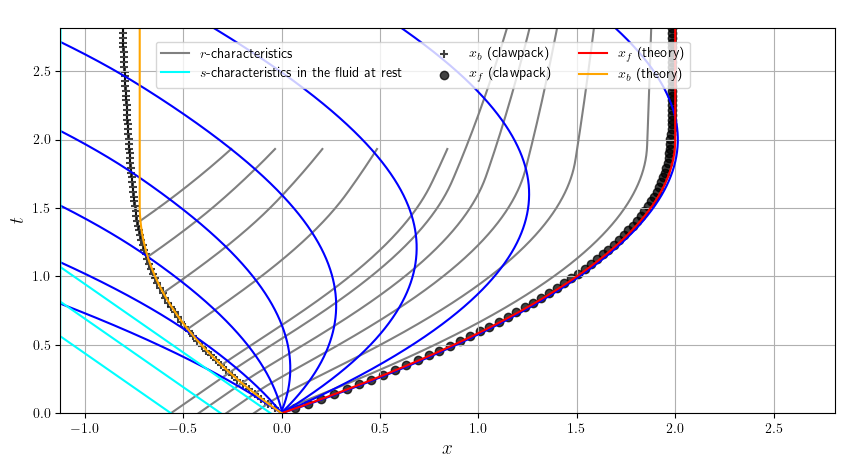

In [100]:
fig, axes = plt.subplots(figsize=(10, 5))
plt.rcParams['text.usetex'] = True
axes.set_xlabel(r'$x$',fontsize=14)
axes.set_ylabel(r'$t$',fontsize=14)
axes.set_xlim((-10/X0,25/X0))
axes.set_ylim((0,8/T0))
 
 
# Time range
t     = np.arange(0.0, 10, 0.01)
t_eps = 0
t2    = np.arange(t_eps, 10, 0.01)

axes.grid()

# r-characteristic
for x0 in np.linspace(-5,0,5):
    # Solve the ODE using odeint
    result = odeint(charac_r,x0, t)
    if x0 == -5:
        axes.plot( result.flatten()/X0,t/T0,color='grey',label=r'$r$-characteristics ')  # r-characteristics
    else:
        axes.plot( result.flatten()/X0,t/T0,color='grey' )

for tt in np.linspace(1.,4,5):
    xx = test_xb(tt/T0)*X0
    t3 = np.arange(tt,5.5,0.01)
    result = odeint(charac_r,xx, t3)
    axes.plot( result.flatten()/X0,t3/T0,color='grey' )
 
# s-characteristic in the rarefaction fan
for ss in np.linspace(-1, 1 , 8):
    result = odeint(charac_s_variante, y0=0, t=t2, args=(ss, μ, g))
    #result = odeint(charac_s, y0=0.001*(2+3*ss)/4 * np.sqrt(g*H0*np.cos(θ)), t=t2 )
    if ss == -2:
        plt.plot( result.flatten()/X0,t2/T0,color='blue',label=r'$s$-characteristics ')   
    else:
        plt.plot( result.flatten()/X0,t2/T0,color='blue' )  


# s-characteristic for the fluid at rest
for x0 in np.linspace(-5,-0.5,3):
    # Solve the ODE using odeint
    result = odeint(charac_s,x0, t)
    if x0 == -5:
        axes.plot( result.flatten()/X0,t/T0,color='cyan',label=r'$s$-characteristics in the fluid at rest')   
    else:
        axes.plot( result.flatten()/X0,t/T0,color='cyan' )

# moving boundaries (clawpack + theory)
axes.scatter(x_back/X0, tps[1:NbSim]/T0,marker='+',color='black',alpha=0.75,label=r'$x_b$ (clawpack)') # measured back front
axes.scatter(x_front/X0,tps[1:NbSim]/T0,marker='o',color='black',alpha=0.75,label=r'$x_f$ (clawpack) ') # measured back front

axes.plot(test_xf(t/T0),t/T0,color='red',label=r'$x_f$ (theory) ')    # front position
axes.plot(test_xb(t/T0),t/T0,color='orange',label=r'$x_b$ (theory) ')  # backward wave
fig.legend(loc='upper center',  ncol=3, borderaxespad=3)

In [101]:
fig.savefig('characteristics_dimensionless.png',dpi=300, bbox_inches='tight')

# Analytical solution

In [102]:
from scipy.special import hyp2f1
from scipy.integrate import quad, dblquad
from functools import lru_cache
from scipy.optimize import root
from scipy.optimize import brentq
from tqdm import tqdm
 
#====================================
@lru_cache(maxsize=None)  # Cache for repeated calls
def Riemann(s, r, a, b):
    """ Riemann function (8.79)."""
    try:
        denominator = (a + r)**1.5 * (s + b)**1.5
    except FloatingPointError:
        return 0.0
    c = (r + s)**3 / denominator
    z = ((r - b) * (s-a)) / ((r+a) * (s+b))
    if np.isnan(z) or abs(z) >= 1.0:  # for hyp2f1 convergence condition
        return 0.0
    return c * hyp2f1(1.5, 1.5, 1, z)



def t_r(r):
    """ approximation of t_r, eq. (8.99)"""
    approx = 3.700279768999653  -2.0222717471071308* r+0.6121280543569234* r**2-0.5305730395014081*\
          r**3+0.32693579002742174* r**4-0.1008432305585469* r**5+0.014345919899608602* r**6
    return approx

def Riemann_s(s,r,a,b):
    """ s-derivative of the Riemann function """
    z    = ((r - b) * (s-a)) / ((r+a) * (s+b))
    aux1 = hyp2f1(1.5, 1.5, 1, z)
    aux2 = hyp2f1(2.5, 2.5, 2, z)
    aux3 =((r+s)**3.)*(((((r-b)/(b+s))/(a+r))-(((r-b)*((s-a)*((b+s)**-2.)))/(a+r)))*aux2)
    aux4 = (-1.5*(((a+r)**-1.5)*(((b+s)**-2.5)*(((r+s)**3.)*aux1))))+(2.25*(((a+r)**-1.5)*(((b+s)**-1.5)*aux3)))
    output=(3.*(((a+r)**-1.5)*(((b+s)**-1.5)*((((r+s)**2))*aux1))))+aux4
    if np.isnan(z) or abs(z) >= 1.0:  # hyp2f1 convergence condition
        return 0.0
    return output

def Riemann_r(s,r,a,b):
    """ r-derivative of the Riemann function """
    z    = ((r - b) * (s-a)) / ((r+a) * (s+b))
    aux1 = hyp2f1(1.5, 1.5, 1, z)
    aux2 = hyp2f1(2.5, 2.5, 2, z)
    aux3=((r+s)**3.)*(((((s-a)/(b+s))/(a+r))-((((a+r)**-2.)*((r-b)*(s-a)))/(b+s)))*aux2) 
    aux4=(-1.5*(((a+r)**-2.5)*(((b+s)**-1.5)*(((r+s)**3.)*aux1))))+(2.25*(((a+r)**-1.5)*(((b+s)**-1.5)*aux3))) 
    output=(3.*(((a+r)**-1.5)*(((b+s)**-1.5)*((((r+s)**2))*aux1))))+aux4 
    if np.isnan(z) or abs(z) >= 1.0:  # hyp2f1 convergence condition
        return 0.0
    return output

def meanRrs(r,a,b):
    """ 
    this function gives (Riemann_r+Riemann_s)/2 along s = r-2  
    by using it we avoid the singularity in aux4 in Riemann_r andRiemann_s
    """
    z =  (((b-r)*(-2.+(a+r)))/(a+r))/((2.+b)-r)
    aux0 = hyp2f1(1.5,1.5,1,z)
    aux1=(-2.+(a+((-3.*b)+((2.*(a*b))+((2.*(((2.+b)-a)*r))+(-2.*(r**2)))))))*aux0
    aux2 = hyp2f1(1.5,2.5,1,z)

    aux3=(((2.+b)-r)*((a+r)*aux1))+(-2.*((a+b)*((((-2.+(a+((a*b)+(((2.+b)-a)*r))))-(r**2))-b)*aux2)))

    if not np.isfinite(aux1): return 0.0
    if not np.isfinite(aux2): return 0.0
    tol = 1e-12
    denom = b - r
    if abs(denom) < tol:
        denom = np.sign(denom) * tol  # avoid division by 0
    if (2 + b - r) <= 0 or (a + r) <= 0 or (b - r) == 0 or not np.isfinite(aux3):
        return 0.0

    output=((6.*((((2.+b)-r)**-2.5)*(((a+r)**-2.5)*aux3)))/(-2.+(a+r)))/denom
    if np.isnan(output) or abs(z) >= 1.0:  # for hyp2f1 convergence condition
        return 0.0
    return output

 

def B(r,a,b):
    """ operator B given by Eq. (8.91) """
    R   = Riemann(2-r,r,a,b)
    #fnc = R*(3*r-4+t_r(r))-(Riemann_s(2-r,r,a,b)+Riemann_r(2-r,r,a,b))*(r-1)
    fnc = R*(3*r-4+t_r(r))-meanRrs(r,a,b)*(r-1)*2
    return fnc

def TRiemann(a,b, eps=1e-9, limit=5000):
    """Compute the dimensionless time given by Eq. (8.99)"""
    def integrand(x):
        return B(x,a,b)
    
    # Handle potential singularities at integration bounds
    result, _ = quad(integrand, 1 + eps, b, 
                    limit=limit, 
                    #points=[2 + eps, r],
                    epsabs=1e-6, 
                    epsrel=1e-6)
    output = (b-1)*Riemann(2-b,b,a,b) + result
    return output

@lru_cache(maxsize=None)  # Cache for repeated calls
def XSRiemann(a, b,  eps=1e-6, limit=5000):
    """dimensionless position x given by Eq. (8.103)"""
    # Compute c1 term
    def TRiemann_integrand(x):
        return TRiemann(a,x)
    
    aux1 = -0.5 * quad(
        TRiemann_integrand, 1,b,
        limit=limit, epsabs=1e-5, epsrel=1e-5)[0] 
    
    aux2 = (b-3*a)/2*TRiemann(a,b)

    aux3 = -0.5*TRiemann(a,b)**2
    
    return aux1 + aux2 + aux3

def r_FB(s):
    """ equation for the FB curve given by Eq. (8.104) in the r-s plane"""
    r = 1.544 + 0.871*s + 0.273*s**2 + 0.029*s**3 + 0.090*s**4 + 0.010*s**5
    return r

 
def position(s,r):
    """Vectorizable position function corresponding to Fig. 8.8"""
    if (r < 1) or (r > 2):
        return np.nan
    elif (s < -1) or (s > 1):
        return np.nan
    elif ( r < r_FB(s)) and (r>1) and (s<1.76571):
        return XSRiemann(s,r)
    elif ( s > 1.76571) and (r>1) and (r<2-s):
        return XSRiemann(s,r)
    else:
        return 0.0

def temps(s,r):
    if r+s == 2:
        return 2*(r-1)
    elif (r < 1) or (r > 2):
        return np.nan
    elif (s < -1) or (s > 1):
        return np.nan
    elif ( r < r_FB(s)) and (r>1) and (s<1.76571):
        return TRiemann(s,r)
    elif ( s > 1.76571) and (r>1) and (r<2-s):
        return TRiemann(s,r)
    else:
        return 0.0


In [103]:
#for f in [Riemann, TRiemann, XSRiemann]: f.cache_clear() # to clean the cache
 

tps = [1,2,3,4,5,6]/T0

ϵ = 1e-5
step = 5.e-3

s_min, s_max = -1 + ϵ, 1 - ϵ
recap_xu, recap_xh, recap_u, recap_h = [], [], [], []

def solve_root(ss, tt):
    sol = root(lambda r: temps(ss, r[0]) - tt, x0=[(ss + 2)/2])
    return sol.x[0] if sol.success else np.nan  # Ensure scalar output

def solve_brentq(ss, tt):
    sol = brentq(lambda r: temps(ss,r) - tt,r_FB(ss),2-ss)
    return sol 

def solve_root(ss, tt):
    def f_r(r):
        try:
            val = TRiemann(ss, r) - tt
            return val if np.isfinite(val) else np.nan
        except:
            return np.nan
    
    # Plage sûre pour r : entre 1 et 1.7657
    r_min = 1.0
    r_max = 1.7657  # Ajuste légèrement si besoin

    try:
        # On vérifie d'abord que la racine est bien encadrée
        if np.sign(f_r(r_min)) * np.sign(f_r(r_max)) < 0:
            sol = brentq(f_r, r_min, r_max, xtol=1e-10)
            return sol
        else:
            #print(f"Avertissement : pas de changement de signe pour ss={ss}, tt={tt}")
            return np.nan
    except Exception as e:
        print(f"Échec brentq pour ss={ss}, tt={tt}, erreur : {e}")
        return np.nan

for tt in tqdm(tps):
    #s_values = np.linspace(s_min, s_max, 40)
    s_values = np.arange(s_min, s_max+step, step)
    r_values = np.array([solve_root(ss, tt) for ss in s_values])  # solve the implicit equation

    valid = ~np.isnan(r_values)
    s_values = s_values[valid]
    r_values = r_values[valid]
    
    solutions_x = np.array([XSRiemann(s,r)  for r, s in zip(r_values, s_values)])
    solutions_u = np.array(r_values-s_values    - tt )
    solutions_h = np.array((r_values + s_values)**2 / 4)

    solutions_xh = solutions_x[(solutions_h<=1) & (solutions_x<=2*tt-tt**2/2)]
    solutions_h = solutions_h[(solutions_h<=1) & (solutions_x<=2*tt-tt**2/2)]
    solutions_xu = solutions_x[(solutions_u>0) & (solutions_x<=2*tt-tt**2/2)]
    solutions_u = solutions_u[(solutions_u>0) & (solutions_x<=2*tt-tt**2/2)]


    recap_xu.append(solutions_xu)
    recap_xh.append(solutions_xh)
    recap_u.append(solutions_u)
    recap_h.append(solutions_h)

100%|██████████| 6/6 [00:38<00:00,  6.48s/it]


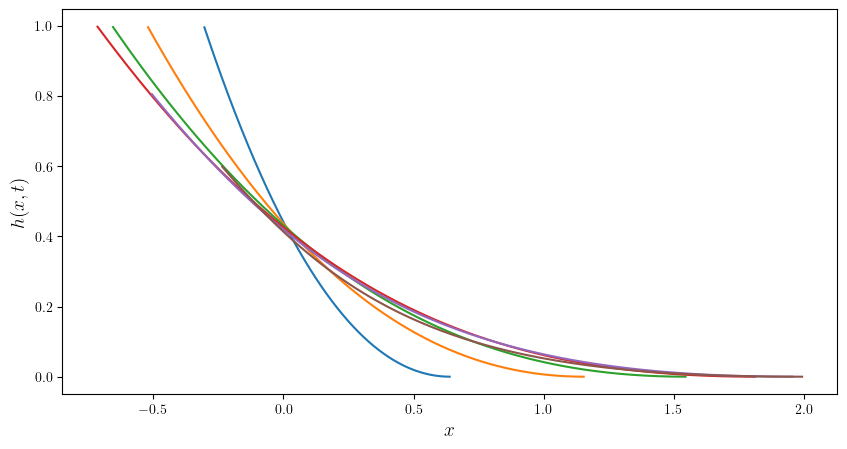

In [104]:
fig, axes = plt.subplots(figsize=(10, 5))
plt.rcParams['text.usetex'] = True
axes.set_xlabel(r'$x$',fontsize=14)
axes.set_ylabel(r'$h(x,t)$',fontsize=14)
# axes.set_xlim((-6/H0,25/H0))
# axes.set_ylim((0,5/T0))
for i in range(6):
    plt.plot(recap_xh[i],recap_h[i])
 

Text(0.9, 0.9, '(b)')

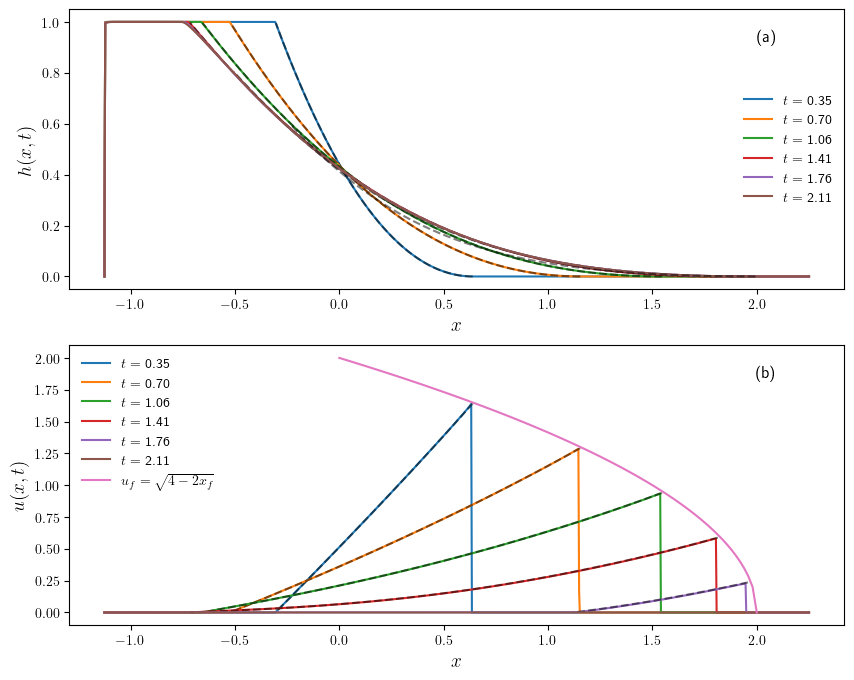

In [105]:
fig, ((ax1, ax2) ) = plt.subplots(2, 1)
fig.set_figheight(8)
fig.set_figwidth(10)
x = np.linspace(-10,20,100)
x = np.linspace(-10,20,1000)
for i in range(6):
        ax1.plot(x/X0, [ interp_h(np.array([[xx, i+1]]) )/H0 for xx in x],  label=r'$ t = $'+f" {(i+1)/T0:.2f}")
        ax1.plot(recap_xh[i],recap_h[i],'--k',alpha=0.5)


ax1.legend(loc='right',frameon=False)
ax1.set_xlabel(r'$x$',fontsize = 14)
ax1.set_ylabel(r'$h(x, t)$',fontsize = 14)
ax1.text(0.9, 0.9,  '(a)',
        horizontalalignment='center',
        verticalalignment='center',
        transform = ax1.transAxes,fontsize=12)
for i in range(6):
        ax2.plot(x/X0, [ fnc_u(xx,i+1)/U0 for xx in x],  label=r'$ t = $'+f" {(i+1)/T0:.2f}")
        ax2.plot(recap_xu[i][::1],recap_u[i][::1],'--k',alpha=0.5)

x_f = np.linspace(0,2,100)
ax2.plot(x_f,np.sqrt(4-2*x_f),label = r'$u_f = \sqrt{4-2x_f}$')

ax2.legend(loc='upper left',frameon=False )
ax2.set_xlabel(r'$x$',fontsize = 14)
ax2.set_ylabel(r'$u(x, t)$',fontsize = 14)
ax2.text(0.9, 0.9,  '(b)',
        horizontalalignment='center',
        verticalalignment='center',
        transform = ax2.transAxes,fontsize=12)

In [106]:
fig.savefig('flow-depth_dimensionless.png',dpi=300, bbox_inches='tight')